In [ ]:
! pip install networkx
! pip install plotly
! pip install colorlover
! pip install NRCLex

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import networkx as nx
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.graph_objs import *
import plotly.graph_objects as go
init_notebook_mode(connected=True)
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk import tokenize
import operator

from nrclex import NRCLex
import nltk
nltk.download('punkt')
import re

from collections import defaultdict

import colorlover as cl
from IPython.display import HTML

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
df = pd.read_csv("corona_tweets.csv")

In [ ]:
print("Num of rows:", df.shape[0])

Num of rows: 2550194


In [ ]:
df['date']=pd.to_datetime(df['date'].str.slice(0,-5),format='%Y-%m-%dT%H:%M:%S')

In [ ]:
df.head()

,date,user,tweet
0,2020-11-01 04:25:52,bernadettecomm1,RT @ClarkeMicah: Anti-lockdown Letters to MPs ...
1,2020-11-01 04:25:52,bluemeade7,RT @petestrzok: RT is registered with the Depa...
2,2020-11-01 04:25:52,_raauull,RT @essmeraldasauce: COVID cases broke single-...
3,2020-11-01 04:25:53,purushothama_n,"RT @SadhguruJV: By their very design, most cit..."
4,2020-11-01 04:25:53,fato_frank,RT @RealCandaceO: Germany and France go back i...


In [ ]:
allTweets = df["tweet"].str.cat(sep=' ')
tweetWords = [word.strip(""" ,.:'\";""").lower() for word in allTweets.split()]
hashTags = [word for word in tweetWords if word.startswith("#")]
hashTagsCounter = Counter(hashTags)

In [ ]:
hashTagsCounter.most_common(100)

[('#1', 87335),
 ('#covid19', 75713),
 ('#coronavirus', 21472),
 ('#covid', 13419),
 ('#lockdown', 11150),
 ('#covid_19', 8178),
 ('#covidiots', 6838),
 ('#lockdown2', 6576),
 ('#vote', 6328),
 ('#wewillnotcomply', 6109),
 ('#pandemic', 5692),
 ('#trump', 4568),
 ('#closetheschools', 3860),
 ('#wearamask', 3587),
 ('#marr', 3005),
 ('#breaking', 2942),
 ('#panicbuying', 2796),
 ('#closeschoolsnow', 2678),
 ('#…', 2587),
 ('#excludeduk', 2540),
 ('#nasaanangpangulo', 2532),
 ('#nhs', 2420),
 ('#art', 2340),
 ('#lockdownuk', 2282),
 ('#staysafe', 2199),
 ('#covid19uk', 2110),
 ('#halloween2020', 2096),
 ('#stayhome', 1888),
 ('#votehimout', 1884),
 ('#corona', 1859),
 ('#covid-19', 1824),
 ('#biden', 1811),
 ('#bidenharris2020', 1807),
 ('#wfh', 1786),
 ('#votebluetoendthenightmare', 1767),
 ('#halloween', 1717),
 ('#2ndlockdown', 1656),
 ('#florida', 1564),
 ('#election2020', 1478),
 ('#trumpdeliverednothing', 1408),
 ('#taiwanmodel', 1381),
 ('#trumpvirus', 1372),
 ('#', 1365),
 ('#wor

In [ ]:
# make a new dataframe just with our hashtag
ukTag = df[df["tweet"].str.lower().str.contains("#lockdownuk", na=False, regex=False)].copy()

In [ ]:
def addMentionedColumn(df):
    
    def mentionsList(txt):
        allWords = [word.strip(""" ,.:'\";""").lower() for word in txt.split()]
        allNames = [word.strip("@") for word in allWords if word.startswith("@")]
        uniqueNames = list(set(allNames))
        return allNames
    
    df["mentioned"] = df["tweet"].apply(mentionsList)

In [ ]:
ukTag.iloc[1,2]

'No science to suggest a #SecondWave #FalsePositive results from inherently unreliable #COVID19 #PCRtest tests are being used to manufacture a "2nd wave" based on "new cases." https://t.co/5oOChVjRyU #MedicalTyranny #lockdownUK #Lockdown2 #ResistLockdown #Casedemic'

In [ ]:
addMentionedColumn(ukTag)

In [ ]:
ukTag.head()

,date,user,tweet,mentioned
284,2020-11-01 04:26:07,actresscamilla,As we move into #Lockdown2 my Short Film SPIRA...,[]
1336,2020-11-01 04:27:02,myteaatom,No science to suggest a #SecondWave #FalsePosi...,[]
5307,2020-11-01 04:30:16,onlytruthtb,@BorisJohnson You are a worst person than comm...,[borisjohnson]
5550,2020-11-01 04:30:28,donnajaiel,RT @Cluckmuckcook: #lockdown #loaf ready . #lo...,[cluckmuckcook]
12124,2020-11-01 04:35:56,np_rn_kay,Anyone think some states will follow the UK’s ...,[]


### Q1. Build a Mention Graph

#### (a) 
How many nodes and how many edges are in your mention graph?

In [ ]:
ukTag_filtered = ukTag.loc[ukTag['mentioned'].apply(lambda x: len(x)>=1)]

In [ ]:
ukTag_filtered.head()

,date,user,tweet,mentioned
5307,2020-11-01 04:30:16,onlytruthtb,@BorisJohnson You are a worst person than comm...,[borisjohnson]
5550,2020-11-01 04:30:28,donnajaiel,RT @Cluckmuckcook: #lockdown #loaf ready . #lo...,[cluckmuckcook]
22185,2020-11-01 04:44:18,beinghuman_taj,RT @SattarFarooqui: #BorisJohnson\n#lockdownUK...,[sattarfarooqui]
26246,2020-11-01 04:47:46,jumprobert,RT @nazirafzal: Here’ the return of the COVID ...,[nazirafzal]
40542,2020-11-01 05:00:24,abbas_mahfooz,RT @SattarFarooqui: #BorisJohnson\n#lockdownUK...,[sattarfarooqui]


In [ ]:
ukTag_filtered.shape

(1116, 4)

In [ ]:
ukTag.shape

(2300, 4)

In [ ]:
# for all the tweets with your hashtag, build the mention graph
def mentionGraph(df):
    g = nx.Graph()
    
    for (index, date,user, tweet, mentionedUsers) in df.itertuples():
        if user != '' and mentionedUsers != []:
            for mentionedUser in mentionedUsers:
              if mentionedUser != '':
                if (user in g) and (mentionedUser in g[user]):
                    g[user][mentionedUser]["numberMentions"] += 1
                else:
                    g.add_edge(user, mentionedUser, numberMentions=1)
    
    return g

In [ ]:
ukGraph_filtered = mentionGraph(ukTag_filtered)

In [ ]:
print("# nodes:", len(ukGraph_filtered.nodes()))
print("# edges:", len(ukGraph_filtered.edges()))

# nodes: 1580
# edges: 1400


There are 1580 nodes and 1400 edges in the mention graph.

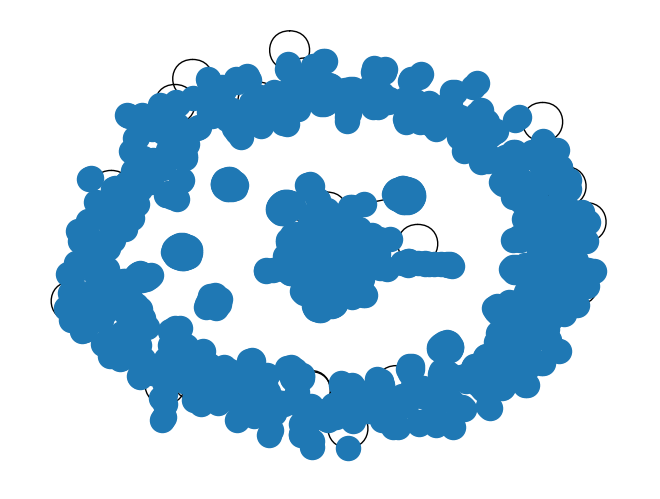

In [ ]:
nx.draw(ukGraph_filtered, with_labels=False)

#### (b)
Build a histogram of the graph nodes’ degree (i.e., the degree distribution of the graph). What does the distribution in node degree tell you about how your network is structured?

In [ ]:
degree_views = nx.degree(ukGraph_filtered)
degree_values = [degree for node, degree in degree_views]
deg_counter = Counter(degree_values)
degrees, counts = zip(*deg_counter.items())

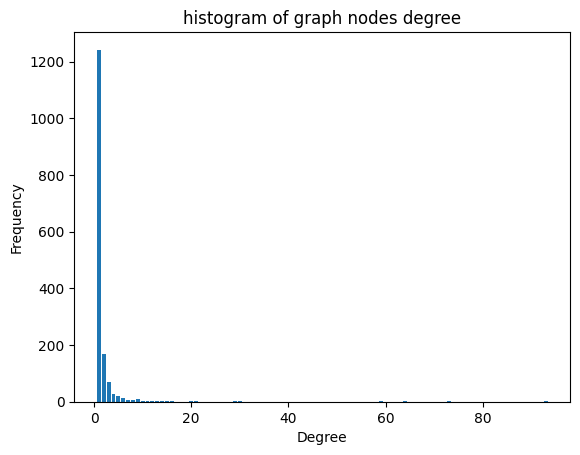

In [ ]:
# Create the histogram
plt.bar(degrees, counts)
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title('histogram of graph nodes degree')
plt.show()

From the histogram, the distribution in node degree is right skew. Most of the degree falls below about 10, and there are some outliers.

#### (c)

Build a log-log scatterplot with the node degree (x-axis) and fraction of nodes with that degree (y-axis). Does your mention graph exhibit a power law trend? If not, can you explain why that may be?

In [ ]:
node_total = len(ukGraph_filtered.nodes())

In [ ]:
frac = {degree:count/node_total for degree, count in deg_counter.items()}

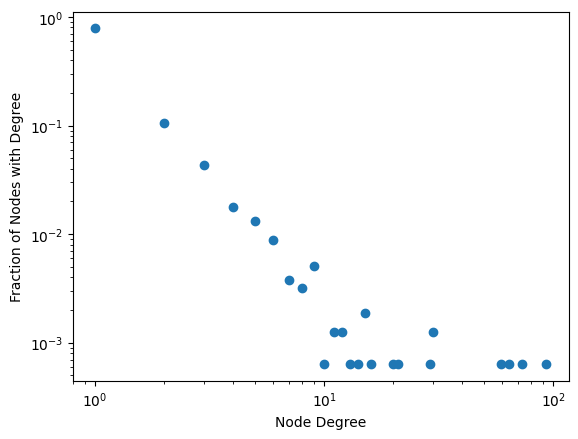

In [ ]:
# Separate the keys (degrees) and values (fractions) into separate lists
degrees, fractions = zip(*frac.items())

# Create the log-log scatterplot
plt.scatter(degrees, fractions)
plt.xscale("log")
plt.yscale("log")

# Set axis labels
plt.xlabel("Node Degree")
plt.ylabel("Fraction of Nodes with Degree")

# Show the plot
plt.show()

In the mention graph, there exists power law trend. The power-law pattern has the form `y = k * x^a`. Here we use log for x and y axis, so the equation becomes: `log(y) = log(k) + a*log(x)`. 

The trend in our graph is the combination of two linear trend, which satisfies. As the log of node degree increase, the log of fraction first decrease, then remain horizontally after log(node degree) = 10.



#### (d)

For the highest-weighted edge, list the tweets (up to 25) for that edge and describe the interaction between these two users which explains why this edge has the highest weight. Note: edges are identified by the two nodes they connect, e.g., ⟨node1, node2⟩.

In [ ]:
highest_edges = max(ukGraph_filtered.edges(data=True), key=lambda x: x[2]['numberMentions'])
highest_edges

('cardstreebeec', 'ebay_uk', {'numberMentions': 38})

In [ ]:
count = 0
for (index, date, user, tweet, mentioned) in ukTag.itertuples():
  for mentionedUser in mentioned:
    if count <= 25:
      if mentionedUser == 'cardstreebeec' and user == 'ebay_uk' or mentionedUser == 'ebay_uk' and user == 'cardstreebeec':
        print('user:', user)
        print('mentionedUser:', mentionedUser)
        print('content of the tweet:', tweet)
        count += 1
    else:
       break     

user: cardstreebeec
mentionedUser: ebay_uk
content of the tweet: #BestOfBritish #Bestseller #bestselling  Personalised Birthday Card UNICORN - Daughter Sister Granddaughter Niece Cousin https://t.co/isRwPtBPc9 via @eBay_UK #lockdown #lockdownUK #crafts
user: cardstreebeec
mentionedUser: ebay_uk
content of the tweet: #BestOfBritish #lockdown #lockdownUK  #Personalised VODKA Birthday Card -Male/Female Any Relation/18th 21st 30th 40th.. https://t.co/3SII72U1a8 via @eBay_UK
user: cardstreebeec
mentionedUser: ebay_uk
content of the tweet: #lockdownUK #lockdown #handmade #homemade #UKCraftersHour #UKGiftHour  Personalised Birthday Card Perfume Ladybird theme -Daughter Granddaughter Sister https://t.co/fcZajuzcV1 via @eBay_UK
user: cardstreebeec
mentionedUser: ebay_uk
content of the tweet: #handmade #homemade #UKCraftersHour #UKGiftHour #lockdownUK #lockdown #waleslockdown #IrelandLockdown #Scotland #Christmas  Handmade Personalised Disney Princesses Birthday Card Daughter Sister Niece etc ht

From the output above, among all of these edges, user `@ebay_uk` were mentioned by user`cardstreebeec`. In twitter, user `@ebay_uk` is an official account for large e-commerce business group; user `@cardstreebeec` is an official account for gift card solder and that solder holds a business account for gift card selling on Ebay (UK). The user mentioned `@ebay_uk` to let customers know their platform for gift card selling. 

Ebay is one of the largest e-commerce business group in the world, and has a large number of followers, mentioning that account could lead to a high weight on the corresponding edge. 

Moreover, due to covid situation, the e-commerce business developed fast and the user `@cardstreebeec` uses hastag like `lockdown` and `lockdownuk`, to attract potential customers who cannot celebrate birthday/ anniversary with their family due to pandamic.

#### (e) 
Provide a visualization of the mention graph in which the edges visually (e.g., color, weight,
etc.) reflects its weight (i.e., the number of mentions). Note: Be sure to use layouts to help
make the visualizations clear.


In [ ]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

In [ ]:
def plotNetworkSize(graph):
    scatters=[]

    # make all the edges
    for (node1, node2) in graph.edges():
        x0, y0 = graph.nodes[node1]['pos']
        x1, y1 = graph.nodes[node2]['pos']
        edgeWidth = graph[node1][node2]['numberMentions']
        s = Scatter(
                x=[x0, x1],
                y=[y0, y1],
                hoverinfo='none',
                mode='lines', 
                line=scatter.Line(width=edgeWidth ,color='#888'))
        scatters.append(s)


    # make all the nodes
    for node in graph.nodes():
        xPos, yPos = graph.nodes[node]['pos']
        s = Scatter(
                x=[xPos], 
                y=[yPos], 
                hoverinfo='none',
                mode='markers', 
                marker=dict(
                    color="#888", 
                    size=nx.degree(graph,node)*2,         
                    line=dict(width=2)))
        scatters.append(s)
    
    layout = Layout(showlegend=False)
    fig = Figure(data=scatters, layout=layout)
    iplot(fig, show_link=False)

In [ ]:
def applyLayout(graph, layoutFunc):
    posDict = layoutFunc(graph) 
    nx.set_node_attributes(graph, name="pos", values=posDict)

In [ ]:
ukGraph_filtered_mention = ukGraph_filtered.copy()

In [ ]:
applyLayout(ukGraph_filtered_mention, nx.spring_layout)

In [ ]:
configure_plotly_browser_state()
plotNetworkSize(ukGraph_filtered_mention)

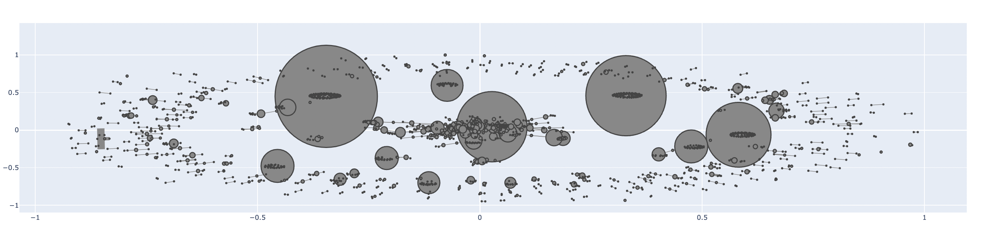

### Q2. Content Analysis

In [ ]:
ukTag['tweet'][:10]

284      As we move into #Lockdown2 my Short Film SPIRA...
1336     No science to suggest a #SecondWave #FalsePosi...
5307     @BorisJohnson You are a worst person than comm...
5550     RT @Cluckmuckcook: #lockdown #loaf ready . #lo...
12124    Anyone think some states will follow the UK’s ...
22185    RT @SattarFarooqui: #BorisJohnson\n#lockdownUK...
23316    'Time for further measures': UK PM imposes sec...
24484    Here we go again on our own.....#COVIDIOTS #lo...
26246    RT @nazirafzal: Here’ the return of the COVID ...
28039    James Bond - #SirSeanConnery is no more, Four-...
Name: tweet, dtype: object

In [ ]:
def get_top_k (df, k, value_column='tweet'):
    stop = set(stopwords.words('english'))
    stop.add('https')
    stop.add('rt')
    stop.add('co')

    counter = Counter()
    for twt in df[value_column]:
        counter.update([word.lower() 
                        for word 
                        in tokenize.regexp.regexp_tokenize(twt, pattern='\w+')
                        if word.lower() not in stop and word.isalpha() and len(word)>=2])
    topk = counter.most_common(k)
    return topk

In [ ]:
top10 = get_top_k(ukTag, 10)

In [ ]:
top10

[('lockdownuk', 2303),
 ('lockdown', 1538),
 ('covid', 240),
 ('go', 208),
 ('borisjohnson', 203),
 ('schools', 189),
 ('people', 184),
 ('boris', 163),
 ('new', 160),
 ('amp', 152)]

The hastag chose was `#lockdownuk`, so the most frequent non-stopwords are `#lockdownuk`, in order to understand the theme better, we get top 10 most frequent non-stopwords, we get `borisjohnson`, `covid`, `people` and `boris`, the theme is about people 's comments for UK's covid policy and for British Prime Minister Boris Johnson.

#### (b)
In a visualization of the mention graph add hover information for the nodes which lists the 3 most common words for each user. Indicate the nodes that have no words visually. For those nodes that have words, are the words similar for connected users or are the words different? If not the same, do the words have similar themes?

In [ ]:
def get_topk_user(df, kwords, user, value_column='tweet'):
    stop = set(stopwords.words('english'))
    counter = Counter()

    user_df = df[df["user"] == user]
    reviews = user_df['tweet'].values
    for review in reviews:
          counter.update([word.lower() 
                          for word 
                          in re.findall(r'\w+', review) 
                          if word.lower() not in stop and len(word) > 2])
    topk = counter.most_common(kwords)
    topk = [n for n, d in topk]
    return topk

In [ ]:
# map purd color scale to 300 cells
purd = cl.scales['9']['seq']['PuRd']
purd300 = cl.interp(purd, 300)
HTML(cl.to_html(purd300))

In [ ]:
def plotNetworkSizeColor_addhover(graph):
    closenessCentr = nx.closeness_centrality(graph)
    maxCentr = max(closenessCentr.values())
    minCentr = min(closenessCentr.values())
    
    scatters=[]

    for (node1, node2) in graph.edges():
        x0, y0 = graph.nodes[node1]['pos']
        x1, y1 = graph.nodes[node2]['pos']
        edgeWidth = graph[node1][node2]['numberMentions']
        s = Scatter(
                x=[x0, x1],
                y=[y0, y1],
                hoverinfo='none',
                mode='lines', 
                line=scatter.Line(width=edgeWidth ,color='#888'))
        scatters.append(s)

    for node in graph.nodes():
        nodeCentr = closenessCentr[node]
        nodeColor = int(299*(nodeCentr-minCentr)/(maxCentr-minCentr))
        xPos, yPos = graph.nodes[node]['pos']
        top_3_words = get_topk_user(df, 3, node)
  
        if len(top_3_words) > 0:
            hover_text = "User: %s <br>" % (node) + "<br> Top 3 words: %s" % ', '.join(top_3_words)
        else:
            hover_text = "User: %s <br>" % (node) + "<br> No top words found"

        s = Scatter(
                x=[xPos], 
                y=[yPos], 
                text=hover_text,
                hoverinfo='text',
                mode='markers', 
                marker=dict(
                    color=["#ffddff" if len(top_3_words) == 0 else purd300[nodeColor]], 
                    size=nx.degree(graph,node)*2,         
                    line=dict(width=2)))
        scatters.append(s)
    
    layout = Layout(showlegend=False)
    fig = Figure(data=scatters, layout=layout)
    iplot(fig, show_link=False)

In [ ]:
ukGraph_filtered_top3 = ukGraph_filtered.copy()
applyLayout(ukGraph_filtered_top3, nx.spring_layout)
configure_plotly_browser_state()
plotNetworkSizeColor_addhover(ukGraph_filtered_top3)

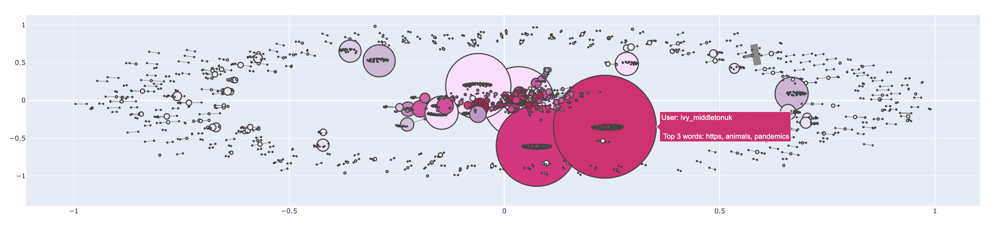

Note: in the graph above, nodes with no words are color in pink (`##ffddff`)


For those nodes that have words, the top 3 most common words for most of the connected users are similar (in related theme). Some connected users' top 3 most common words are same. For example, user `@lez_the` and user `@midworldmo` have the same top 3 most common words (fokawolf, new, rules).

### Q3. Centrality Analysis

#### (a)

Using PageRank and a 2nd centrality measure of your choosing, calculate the centrality of the nodes on your graph based on each of the measures. Provide a mention graph visualization for each measure that demonstrates the centrality value of each node using a visual property (size, color, etc) for each of the centrality measures.

Here I choose betweenness centrality

In [ ]:
#pagerank
page_centr = nx.pagerank(ukGraph_filtered)

In [ ]:
page_centr

{'onlytruthtb': 0.0002894409006332735,
 'borisjohnson': 0.01464317666705259,
 'donnajaiel': 0.0006329113924050633,
 'cluckmuckcook': 0.0006329113924050633,
 'beinghuman_taj': 0.00040398599509728055,
 'sattarfarooqui': 0.0010907621870206285,
 'jumprobert': 0.0003513106769728948,
 'nazirafzal': 0.009080932855370113,
 'abbas_mahfooz': 0.00040398599509728055,
 'hiteshp75014563': 0.0003544111380254499,
 'zeenewsenglish': 0.0036753414642397703,
 'stefing': 0.0003917472385696556,
 'markstokesouth': 0.0022630059654879485,
 'toryfibs': 0.0026365759776141805,
 'prabpkumar': 0.0003917472385696556,
 'ziadmiqdadi': 0.0003444317242688068,
 '_emmanuel_y': 0.017381794660605892,
 'ianm_ah': 0.0004803843583625441,
 'keir_starmer': 0.002021545101106643,
 'sriramansri': 0.0003917472385696556,
 'aambhartiya30': 0.0003544111380254499,
 'this_worldsucks': 0.0003917472385696556,
 'prasadreddyshvd': 0.0003544111380254499,
 'dilbag_koundal': 0.0003544111380254499,
 'rajapatel878': 0.0003544111380254499,
 'tla52

In [ ]:
def plotNetworkSizeColor_centrality(graph, centrality_data):

    maxCentr = max(centrality_data.values())
    minCentr = min(centrality_data.values())
    
    scatters=[]

    for (node1, node2) in graph.edges():
        x0, y0 = graph.nodes[node1]['pos']
        x1, y1 = graph.nodes[node2]['pos']
        edgeWidth = graph[node1][node2]['numberMentions']
        s = Scatter(
                x=[x0, x1],
                y=[y0, y1],
                hoverinfo='none',
                mode='lines', 
                line=scatter.Line(width=edgeWidth ,color='#888'))
        scatters.append(s)

    mydict = centrality_data
    for node in graph.nodes():
        nodeCentr = centrality_data[node]
        nodeColor = int(299*(nodeCentr-minCentr)/(maxCentr-minCentr))
        xPos, yPos = graph.nodes[node]['pos']

        if node in mydict:
          centrality = mydict[node]
  
        hover_text = "User: %s <br>" % (node) + "<br> centrality %s" % (centrality)
      
        s = Scatter(
                x=[xPos], 
                y=[yPos], 
                text=hover_text,
                hoverinfo='text',
                mode='markers', 
                marker=dict(
                    color=purd300[nodeColor], 
                    size=nx.degree(graph,node)*2,         
                    line=dict(width=2)))
        scatters.append(s)
    
    layout = Layout(showlegend=False)
    fig = Figure(data=scatters, layout=layout)
    iplot(fig, show_link=False)

In [ ]:
ukGraph_filtered_centrality_pr = ukGraph_filtered.copy()
applyLayout(ukGraph_filtered_centrality_pr, nx.spring_layout)
configure_plotly_browser_state()
plotNetworkSizeColor_centrality(ukGraph_filtered_centrality_pr, page_centr)

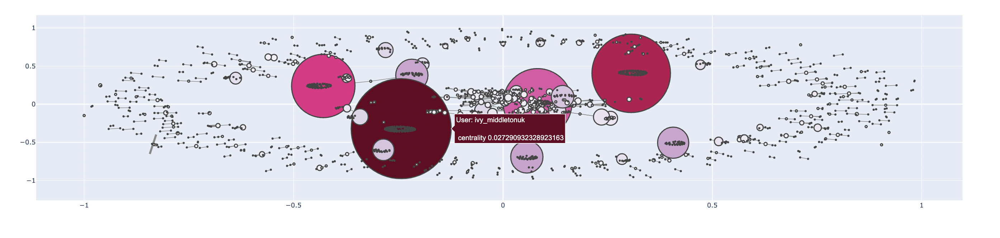

In [ ]:
#betweenness
between_centr = nx.betweenness_centrality(ukGraph_filtered)

In [ ]:
between_centr

{'onlytruthtb': 0.0,
 'borisjohnson': 0.03540708771837453,
 'donnajaiel': 0.0,
 'cluckmuckcook': 0.0,
 'beinghuman_taj': 0.0,
 'sattarfarooqui': 8.026770886259854e-07,
 'jumprobert': 0.0,
 'nazirafzal': 0.00034916453355230364,
 'abbas_mahfooz': 0.0,
 'hiteshp75014563': 0.0,
 'zeenewsenglish': 0.0008387975576141547,
 'stefing': 2.000518282421716e-05,
 'markstokesouth': 3.130440645641343e-05,
 'toryfibs': 0.0036614115397674324,
 'prabpkumar': 2.000518282421716e-05,
 'ziadmiqdadi': 0.0,
 '_emmanuel_y': 0.0033287018865319614,
 'ianm_ah': 0.00033767318738573896,
 'keir_starmer': 0.002236035199722875,
 'sriramansri': 2.000518282421716e-05,
 'aambhartiya30': 0.0,
 'this_worldsucks': 2.000518282421716e-05,
 'prasadreddyshvd': 0.0,
 'dilbag_koundal': 0.0,
 'rajapatel878': 0.0,
 'tla5215596': 0.0,
 'india194715aug': 0.0,
 'bbcsarika': 2.247495848152759e-05,
 'mohith__rai': 0.0008572591306525523,
 'emiratesbailey': 0.002570172037780405,
 'shivnath_m': 0.0,
 'thedailypioneer': 0.0,
 'misra_amrita'

In [ ]:
ukGraph_filtered_centrality_bc = ukGraph_filtered.copy()
applyLayout(ukGraph_filtered_centrality_bc, nx.spring_layout)
configure_plotly_browser_state()
plotNetworkSizeColor_centrality(ukGraph_filtered_centrality_bc, between_centr)

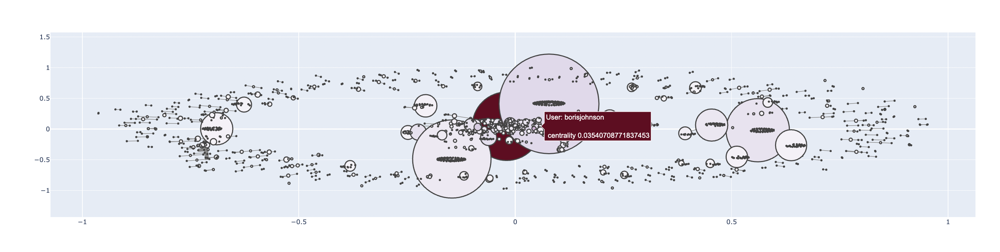

#### (b)
(1) List the 5 most central nodes for each of the centrality measures. Discuss the following:


In [ ]:
sorted_between_centr = sorted(between_centr.items(), key=lambda x:x[1], reverse = True)

In [ ]:
sorted_between_centr[:5]

[('borisjohnson', 0.03540708771837453),
 ('julianstorey', 0.009992398847089703),
 ('loveisbrilliant', 0.009741354518331),
 ('mytweetuk', 0.006815724987977669),
 ('jamesdelingpole', 0.005088972741888747)]

In [ ]:
sorted_page_centr = sorted(page_centr.items(), key=lambda x:x[1], reverse = True)

In [ ]:
sorted_page_centr[:5]

[('ivy_middletonuk', 0.027290932328923163),
 ('thetodaysgolfer', 0.02160730950735282),
 ('_emmanuel_y', 0.017381794660605892),
 ('borisjohnson', 0.01464317666705259),
 ('nazirafzal', 0.009080932855370113)]

The top 5 most central nodes listed using both betweenness centrality and pagerank includes `@borisjohnson`, but the nodes in pagerank have more followers in twitter than nodes in betweenness centrality.

Reason: Pagerank is more suitable for large network and highly asymmetric link patterns (e.g. social network where some users have many more followers than others). Pagerank takes into account the quality of income links, not just the number of income links. However, betweenness centrality only considers the number of shortest paths that pass through a node.

(2) What centrality measure is more useful for your network? Why?

Pagerank is more useful for my network. The tag I chose is `#lockdownuk`, which is about policy and politics in UK during COVID-19. PageRank considers the entire network structure when calculating centrality, which could provide a more accurate measure of overall influence and importance in the network. In contrast, betweenness centrality only considers the local structure around each node. The influence of politics is countrywide and worldwide, using pagerank we could know how other authoritative persons think about the politics, which is more reasonable and meaningful.

### Q4. Sentiment Analysis

#### (a)

Using NRCLex, evaluate each tweet and determine the number of words in each dimension of emotion. Construct a chart showing the number of words in each emotion. Which emotion is most frequent in the data? Does that make sense in the context of your chosen hash-tag? Explain why or why not by providing example tweets to support your claims

In [ ]:
ukTag_filtered

,date,user,tweet,mentioned
5307,2020-11-01 04:30:16,onlytruthtb,@BorisJohnson You are a worst person than comm...,[borisjohnson]
5550,2020-11-01 04:30:28,donnajaiel,RT @Cluckmuckcook: #lockdown #loaf ready . #lo...,[cluckmuckcook]
22185,2020-11-01 04:44:18,beinghuman_taj,RT @SattarFarooqui: #BorisJohnson\n#lockdownUK...,[sattarfarooqui]
26246,2020-11-01 04:47:46,jumprobert,RT @nazirafzal: Here’ the return of the COVID ...,[nazirafzal]
40542,2020-11-01 05:00:24,abbas_mahfooz,RT @SattarFarooqui: #BorisJohnson\n#lockdownUK...,[sattarfarooqui]
...,...,...,...,...
2381978,2020-11-02 02:36:34,sarah76723558,RT @azardsphere: Get it into your heads fast B...,[azardsphere]
2405169,2020-11-02 02:51:30,gardenswhatever,RT @Ncknwmn: The week in cartoons in ⁦@thesund...,[ncknwmn]
2518010,2020-11-02 04:02:04,joe_dee01,RT @BenToni17: Lockdown Idiocracy perfectly de...,[bentoni17]
2539444,2020-11-02 04:17:32,legendtaleskin1,https://t.co/g5crSkI5Pw… via @amazon Perfect w...,[amazon]


In [ ]:
emotions_dict = {}
for tweet in ukTag_filtered["tweet"]:
  text_object = NRCLex(tweet)
  num_words = text_object.raw_emotion_scores
  for emo in num_words:
    if emo in emotions_dict:
      emotions_dict[emo] = emotions_dict[emo] + num_words[emo]
    else:
      emotions_dict[emo] = num_words[emo]
emotions_dict

{'negative': 463,
 'positive': 680,
 'trust': 349,
 'disgust': 106,
 'sadness': 186,
 'anticipation': 299,
 'surprise': 157,
 'anger': 146,
 'fear': 283,
 'joy': 196}

<ipython-input-99-59325c94a792>:17: UserWarning:

FixedFormatter should only be used together with FixedLocator



<Figure size 1200x600 with 0 Axes>

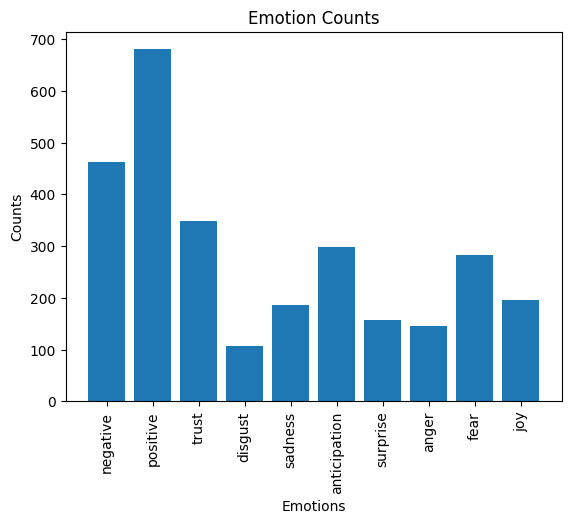

In [ ]:
import matplotlib.pyplot as plt

# Separate keys (emotions) and values (counts)
emotions = list(emotions_dict.keys())
counts = list(emotions_dict.values())

plt.figure(figsize=(12, 6))

# Create a bar char
fig, ax = plt.subplots()
plt.bar(emotions, counts)

# Set chart title and labels for x and y axes
plt.title('Emotion Counts')
plt.xlabel('Emotions')
plt.ylabel('Counts')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


# Display the chart
plt.show()

From the bar chart above, positive is the most frequent emotion in the data. This does not make sense in the context of the chosen tag. For example, tweet `In light of the new lockdown introduced by Boris Johnson, Nicola Sturgeon has released the following statement..."Gonna stay in yer ain bit fur the noo".` 

The result got from NRCLex is positive and trust, however, this user is ironying UK's lockdown policy, which is negative emotion. 

The reason is NRCLex could only perform sentiment analysis based on words and analyzes the literal meaning of words. Irony is a type of figurative language where the intended meaning is opposite to the literal meaning of the words used. This means that the words used in an ironic statement may not necessarily reflect the true emotions of the speaker or writer.

#### (b)

For each user, determine which fraction of a user’s total identified words are in each emotional affect (i.e., normalize the counts for each user). Identify the users with the highest fraction of words in each emotion. Note: You may wish to set a minimum number of tweets for user’s to be considered.

In [ ]:
user_twt_dict = {}

for index, row in ukTag_filtered.iterrows():
    user = row['user']
    tweet = row['tweet']
    
    if user in user_twt_dict:
        user_twt_dict[user].append(tweet)
    else:
        user_twt_dict[user] = [tweet]

In [163]:
highest_frac_dict = {}

for user in user_twt_dict:
  if len(user_twt_dict[user]) >= 2:
    user_total_dict = {}
    for tweet in user_twt_dict[user]:
      text_object = NRCLex(tweet)
      num_words = text_object.raw_emotion_scores

      if user_total_dict == {}:
        user_total_dict = num_words
      else:
        for i in num_words:
            if i in user_total_dict:
              user_total_dict[i] += num_words[i]
            else:
              user_total_dict[i] = num_words[i]

    if user_total_dict != {}:
        max_emotion = max(user_total_dict, key=lambda k: user_total_dict[k])
        highest_frac_dict[user] = [max_emotion, user_total_dict[max_emotion]/emotions_dict[max_emotion]]

In [164]:
highest_frac_dict

{'mohith__rai': ['surprise', 0.006369426751592357],
 'kingban50512521': ['fear', 0.0035335689045936395],
 'loveisbrilliant': ['anticipation', 0.03678929765886288],
 'toucheadrian': ['anger', 0.00684931506849315],
 'dawnneesom': ['fear', 0.007067137809187279],
 'careisthekey': ['anger', 0.00684931506849315],
 'politicsaired': ['negative', 0.012958963282937365],
 'photopro28': ['trust', 0.022922636103151862],
 'nicktubechannel': ['negative', 0.0021598272138228943],
 'lindquist_lord': ['fear', 0.01060070671378092],
 'hughjam75402652': ['negative', 0.008639308855291577],
 'effiedeans': ['positive', 0.0058823529411764705],
 'ninsrai': ['positive', 0.0029411764705882353],
 'ncknwmn': ['positive', 0.0014705882352941176],
 'dsmitheconomics': ['positive', 0.0014705882352941176],
 'coronaupdatebot': ['fear', 0.0035335689045936395],
 'tangerine94': ['trust', 0.0028653295128939827],
 'mythomaniacsuk': ['positive', 0.0029411764705882353],
 'supersysez': ['fear', 0.028268551236749116],
 'tracywooduk

In [159]:
max_user_emo = {}

for user in highest_frac_dict:
  emotion = highest_frac_dict[user][0]
  emotion_score = highest_frac_dict[user][1]

  if emotion not in max_user_emo:
    max_user_emo[emotion] = (user, emotion_score)

  elif emotion_score > max_user_emo[emotion][1]:
    max_user_emo[emotion] = (user, emotion_score)

In [160]:
max_user_emo

{'surprise': ('mohith__rai', 0.006369426751592357),
 'fear': ('supersysez', 0.028268551236749116),
 'anticipation': ('loveisbrilliant', 0.03678929765886288),
 'anger': ('toucheadrian', 0.00684931506849315),
 'negative': ('politicsaired', 0.012958963282937365),
 'trust': ('photopro28', 0.022922636103151862),
 'positive': ('secretgrassroo3', 0.010294117647058823)}

#### (c)

Construct a plot(s) to answer the following: Is there a correlation between any dimension of emotion and one of the centrality measures you evaluated? If you see a trend, please provide a hypothesis for why; if you do not see a trend, provide a hypothesis for why centrality of a user has no observed correlation with emotion in your particular dataset.

In [142]:
#any dimension
emo_data = {}

for user in page_centr:
    if user in highest_frac_dict:
        emo_data[user] = (page_centr[user], highest_frac_dict[user][1])

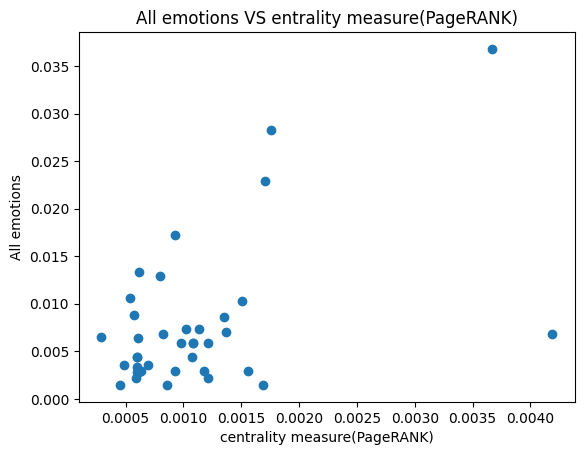

<Figure size 1900x600 with 0 Axes>

In [147]:
# Extract x and y coordinates from the dictionary
x_values = [value[0] for value in emo_data.values()]
y_values = [value[1] for value in emo_data.values()]

# Create the scatter plot
plt.scatter(x_values, y_values)

# Add labels and title
plt.xlabel('centrality measure(PageRANK)')
plt.ylabel('All emotions')
plt.title('All emotions VS entrality measure(PageRANK)')
plt.figure(figsize=(19, 6))
# Show the plot
plt.show()

In [155]:
#negative 
negative_emo = {}

highest_fraction_dict_negative = {}

for user in highest_frac_dict:
  if highest_frac_dict[user][0] == 'negative':
    highest_fraction_dict_negative[user] = (highest_frac_dict[user][0],highest_frac_dict[user][1])
for user in page_centr:
    if user in highest_fraction_dict_negative:
        negative_emo[user] = (page_centr[user], highest_fraction_dict_negative[user][1])

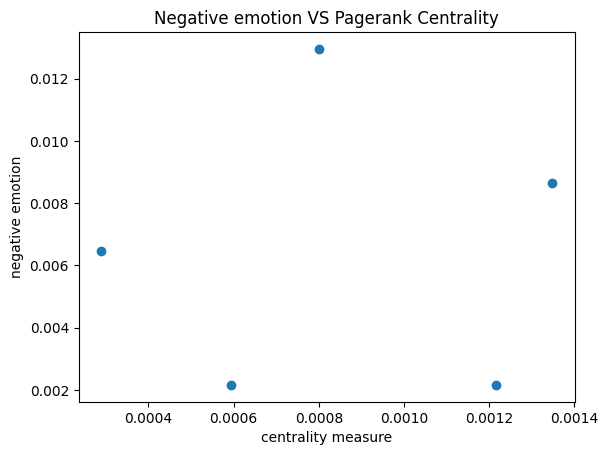

<Figure size 1900x600 with 0 Axes>

In [157]:
x = [value[0] for value in negative_emo.values()]
y = [value[1] for value in negative_emo.values()]


plt.scatter(x, y)

plt.xlabel('centrality measure')
plt.ylabel('negative emotion')
plt.title('Negative emotion VS Pagerank Centrality')
plt.figure(figsize=(19, 6))

plt.show()

In [151]:
#positive
positive_emo = {}

highest_fraction_dict_postive = {}

for user in highest_frac_dict:
  if highest_frac_dict[user][0] == 'positive':
    highest_fraction_dict_postive[user] = (highest_frac_dict[user][0],highest_frac_dict[user][1])
for user in page_centr:
    if user in highest_fraction_dict_postive:
        positive_emo[user] = (page_centr[user], highest_fraction_dict_postive[user][1])

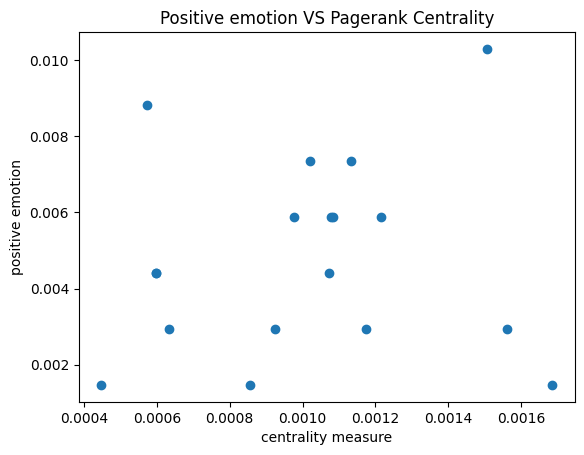

<Figure size 1900x600 with 0 Axes>

In [158]:

x = [value[0] for value in positive_emo.values()]
y = [value[1] for value in positive_emo.values()]

plt.scatter(x, y)

plt.xlabel('centrality measure')
plt.ylabel('positive emotion')
plt.title('Positive emotion VS Pagerank Centrality')
plt.figure(figsize=(19, 6))

plt.show()

There is no significant correlation between pagerank centrality and positive (or negative) emotion. This maybe due to the number of nodes and the number of edges for chosen tag is close, with `#nodes = 1580
and #edges = 1400` and our dataset is small.The influence of any one user is spread out over many other users and there is no strong correlation between pagerank centrality and emotion.

